1. サッカー動画を集める
2. 選手のトラッキング
3. ユニフォームの色によるチーム分け
4. 二次元鳥瞰図にマッピング
<br/>
else
5. ボールのトラッキング

6. 参考

- https://towardsdatascience.com/how-to-track-football-players-using-yolo-sort-and-opencv-6c58f71120b8
- https://github.com/KananVyas/PlayerDetection
- https://medium.com/@kananvyas/player-and-football-detection-using-opencv-python-in-fifa-match-6fd2e4e373f0
- https://www.researchgate.net/publication/331627725_An_Automated_Player_Detection_and_Tracking_in_Basketball_Game

In [346]:
import cv2
import numpy as np
from IPython.display import display, Image, HTML
import matplotlib.pyplot as plt
from matplotlib import animation
from copy import deepcopy
%matplotlib inline

In [347]:
def display_cv_image(image, format='.png'):
    decoded_bytes = cv2.imencode(format, image)[1].tobytes()
    display(Image(data=decoded_bytes))

In [348]:
def display_video(frames):
    plt.figure(figsize=(20, 10), dpi=50)
    patch = plt.imshow(frames[0], cmap='gray')
    plt.axis('off')
    
    def animate(i):
        patch.set_data(frames[i])
    
    anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
    display(HTML(anim.to_jshtml(default_mode='once')))
    plt.close()

In [349]:
vidcap = cv2.VideoCapture('game2.mov')

In [350]:
vidcap.get(cv2.CAP_PROP_FRAME_COUNT)

283.0

In [351]:
# 幅
W = vidcap.get(cv2.CAP_PROP_FRAME_WIDTH)
# 高さ
H = vidcap.get(cv2.CAP_PROP_FRAME_HEIGHT)
# fps
fps = vidcap.get(cv2.CAP_PROP_FPS)
print(W, H, fps)

828.0 1792.0 59.163763066202094


In [352]:
# frames = []

# count = 1

# while True:
#     print(count)
#     success,image = vidcap.read()
#     image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
#     frames.append(image.tolist())
#     count = count + 1
    
#     if not success: 
#         break

In [353]:
# display_video(frames)

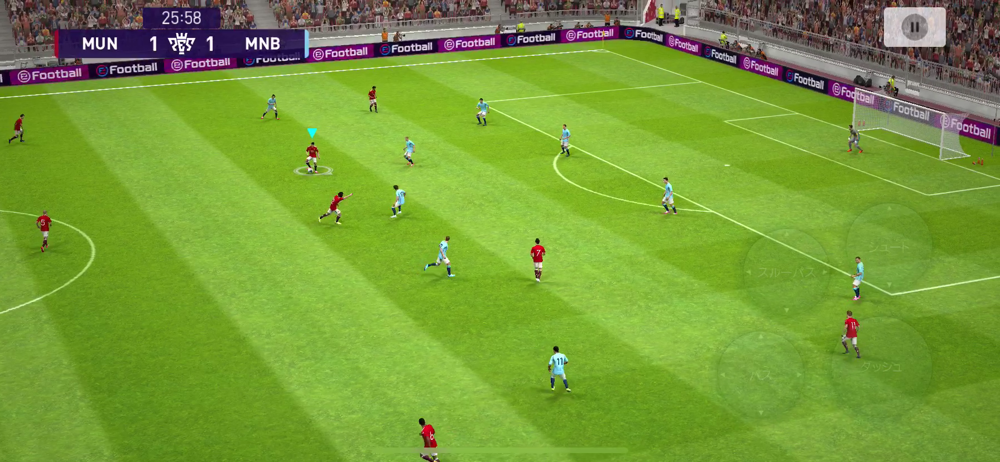

In [344]:
success,image = vidcap.read()
image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
image.shape
display_cv_image(image, '.png')

hsv image


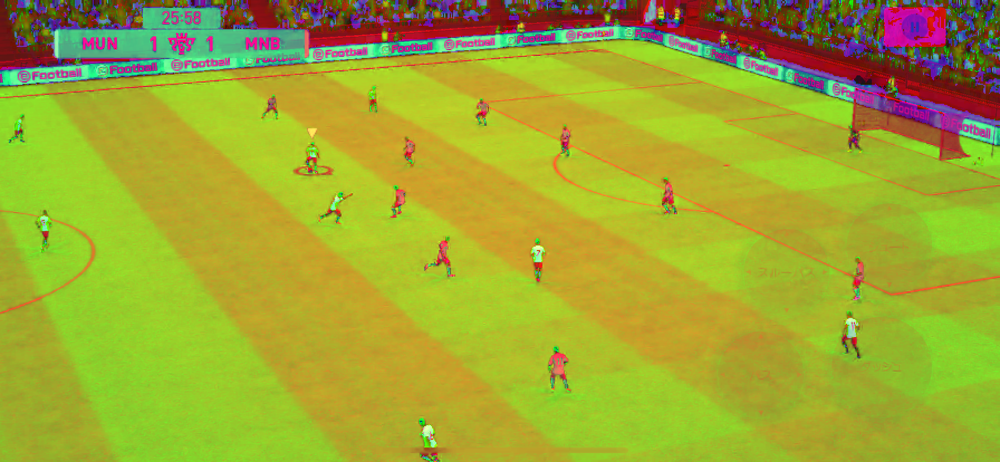

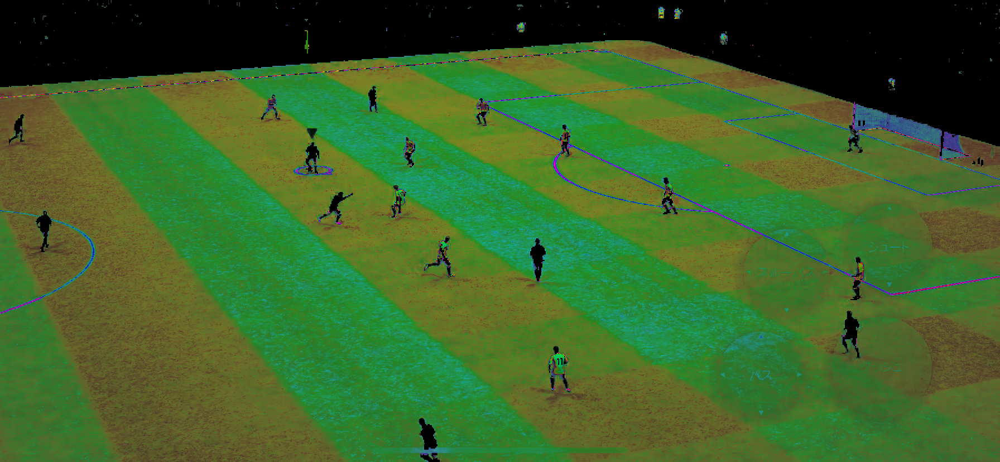

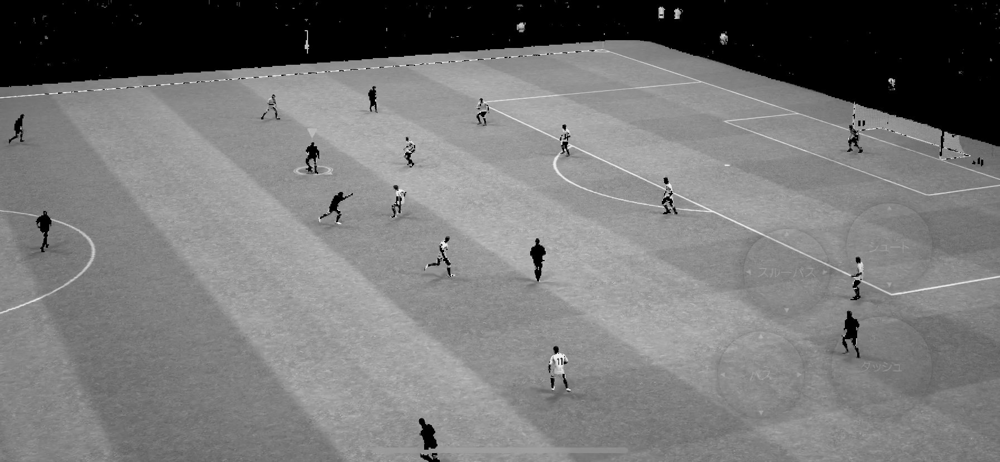

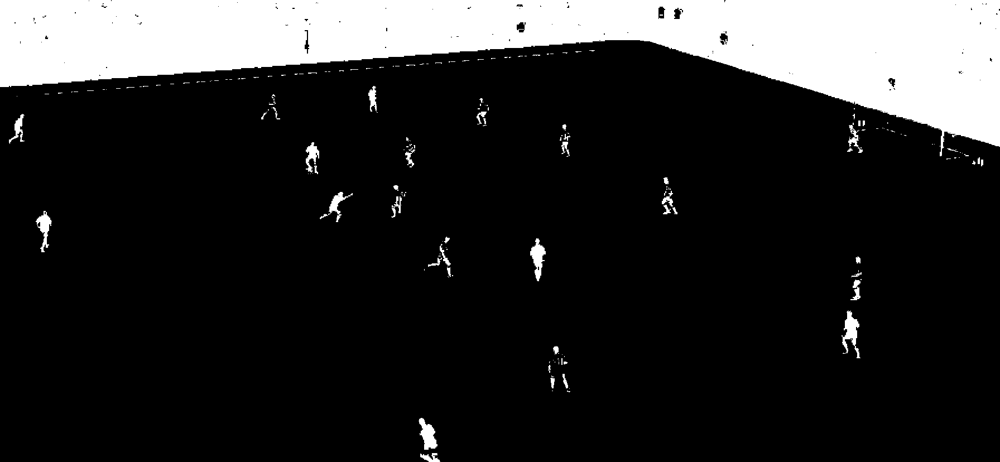

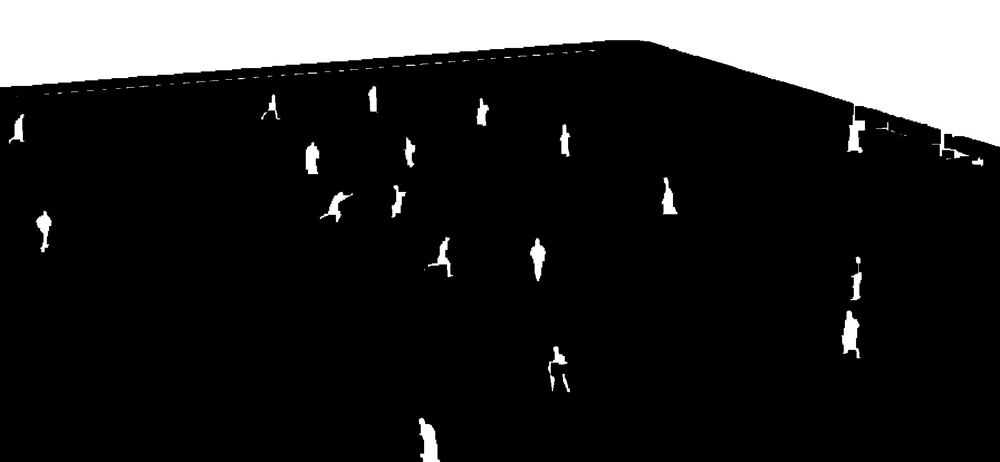

In [345]:
while success:
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    print("hsv image")
    display_cv_image(hsv, '.png')
    
    #green range
    lower_green = np.array([30,40, 40])
    upper_green = np.array([100, 255, 255])
    
    lower_red = np.array([0,180,150])
    upper_red = np.array([180,255,255])
    
    lower_blue = np.array([70,60,200])
    upper_blue = np.array([110,255,255])
    
    lower_white = np.array([0,0,0])
    upper_white = np.array([0,0,255])
    
    
    mask = cv2.inRange(hsv, lower_green, upper_green)
    res = cv2.bitwise_and(image, image, mask=mask)
    
    res_bgr = cv2.cvtColor(res,cv2.COLOR_HSV2BGR)
    display_cv_image(res_bgr, '.png')
    res_gray = cv2.cvtColor(res,cv2.COLOR_BGR2GRAY)
    display_cv_image(res_gray, '.png')
    
    kernel = np.ones((13,13),np.uint8)
    thresh = cv2.threshold(res_gray,127,255,cv2.THRESH_BINARY_INV |  cv2.THRESH_OTSU)[1]
    display_cv_image(thresh, '.png')
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    display_cv_image(thresh, '.png')
    break

In [326]:
im2,contours,hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

In [327]:
idx = 0
font = cv2.FONT_HERSHEY_SIMPLEX

red_players_points = []
blue_players_points = []


for c in contours:
        x,y,w,h = cv2.boundingRect(c)
        print(w, h)
#         if w:
        if ( w > 2 and w < 120 and h > 2 and h < 120):
#             print(w, h)
#             cv2.rectangle(image,(x,y),(x+w,y+h),(0,0,255),3)
            
            idx += 1
            player_img = image[y:y+h,x:x+w]
            
            player_hsv = cv2.cvtColor(player_img,cv2.COLOR_BGR2HSV)
            mask1 = cv2.inRange(player_hsv, lower_blue, upper_blue)
            res1 = cv2.bitwise_and(player_img, player_img, mask=mask1)
            res1 = cv2.cvtColor(res1,cv2.COLOR_HSV2BGR)
            res1 = cv2.cvtColor(res1,cv2.COLOR_BGR2GRAY)
            nzCount = cv2.countNonZero(res1)
            
            mask2 = cv2.inRange(player_hsv, lower_red, upper_red)
            res2 = cv2.bitwise_and(player_img, player_img, mask=mask2)
            res2 = cv2.cvtColor(res2,cv2.COLOR_HSV2BGR)
            res2 = cv2.cvtColor(res2,cv2.COLOR_BGR2GRAY)
            nzCountred = cv2.countNonZero(res2)
            
            if(nzCount >= 10):
#                 cv2.putText(image, 'team1', (x-2, y-2), font, 0.8, (255,0,0), 2, cv2.LINE_AA)
                cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,0),3)
                cv2.circle(image, (x+w//2, y+h//2), 1, (255, 0, 0), thickness=10)
                blue_players_points.append([x+w//2, y+h//2])
            elif(nzCountred>=10):
                
                #Mark red jersy players as belgium
#                 cv2.putText(image, 'team2', (x-2, y-2), font, 0.8, (0,0,255), 2, cv2.LINE_AA)
                cv2.rectangle(image,(x,y),(x+w,y+h),(0,0,255),3)
                cv2.circle(image, (x+w//2, y+h//2), 1, (0, 0, 255), thickness=10)
                red_players_points.append([x+w//2, y+h//2])

39 79
14 33
35 81
34 86
1 3
20 78
28 77
45 73
29 74
59 54
27 58
28 66
8 2
20 16
24 57
21 54
4 2
2 1
8 3
19 58
22 15
28 54
2 1
11 14
22 50
1 1
22 45
8 1
8 2
12 2
12 1
7 1
8 1
15 2
15 46
16 2
8 2
7 1
12 2
16 2
2 1
13 1
12 1
14 2
10 2
8 2
8 2
16 2
16 2
10 1
8 2
14 2
11 2
8 2
12 2
16 2
16 2
12 2
12 2
13 2
11 2
8 2
12 2
16 2
14 2
12 2
9 2
11 2
10 2
1792 284


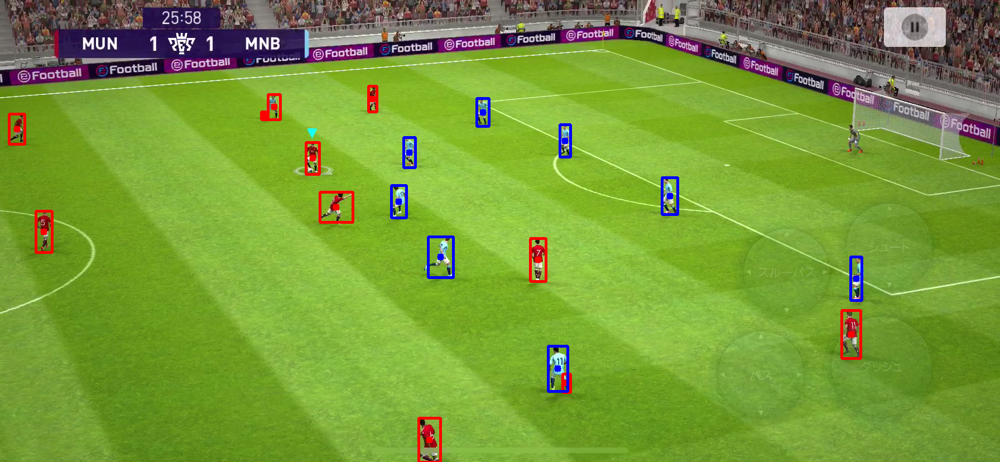

In [328]:
display_cv_image(image, '.png')

In [329]:
# getPerspectiveTransform

In [330]:
src_pts = np.array([[30, 175], [1080, 90], [1790, 322], [1600, 525]], dtype=np.float32)
dst_pts = np.array([[400, 4], [710, 4], [710, 370], [600, 370]], dtype=np.float32)
mat = cv2.getPerspectiveTransform(src_pts, dst_pts)

In [331]:
print(mat)

[[ 1.60403988e-01  3.36005990e+00  2.89885331e+02]
 [ 2.37112944e-01  2.98215109e+00 -5.20162749e+02]
 [-5.09517153e-04  6.98317342e-03  1.00000000e+00]]


In [332]:
def transform_plot(mat, point):
    x, y = point
    A = mat[0][0]
    B = mat[0][1]
    C = mat[0][2]
    D = mat[1][0]
    E = mat[1][1]
    F = mat[1][2]
    G = mat[2][0]
    H = mat[2][1]
    
    x_trans = (A * x + B*y + C) / (G * x + H*y +1)
    y_trans = (D * x + E*y + F) / (G * x + H*y +1)
    
    return int(x_trans) , int(y_trans)

In [333]:
field = cv2.imread('field.png')

for points in red_players_points:
    print(points)
    x, y = transform_plot(mat, points)
    print(x, y)
    cv2.circle(field, (x, y), 1, (0, 0, 255), thickness=10)

    
for points in blue_players_points:
    print(points)
    x, y = transform_plot(mat, points)
    print(x, y)
    cv2.circle(field, (x, y), 1, (255, 0, 0), thickness=10)

[769, 788]
500 329
[1015, 686]
522 334
[1525, 599]
578 369
[964, 465]
534 291
[78, 415]
439 190
[602, 371]
497 221
[560, 283]
494 169
[30, 231]
412 67
[473, 207]
481 94
[491, 191]
484 79
[667, 177]
522 87
[999, 660]
523 330
[1534, 499]
597 359
[789, 460]
514 272
[714, 361]
512 229
[1200, 351]
585 285
[733, 273]
523 184
[1012, 252]
578 210
[865, 201]
562 144


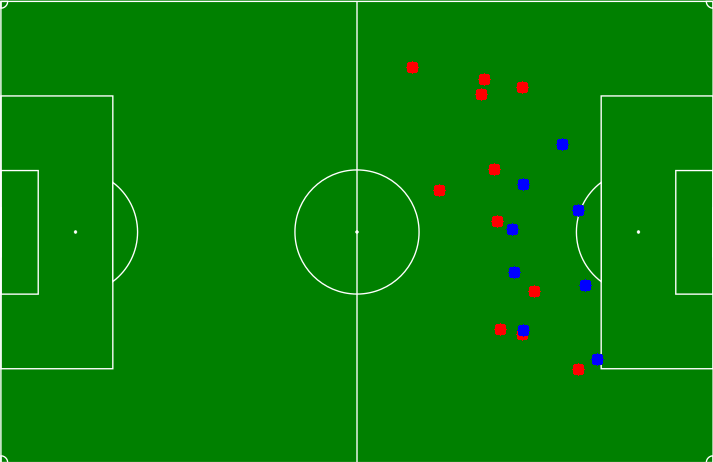

In [334]:
display_cv_image(field, '.png')

In [286]:
red_players_points

[[769, 788],
 [1015, 686],
 [1525, 599],
 [964, 465],
 [78, 415],
 [602, 371],
 [560, 283],
 [30, 231],
 [473, 207],
 [491, 191],
 [667, 177]]

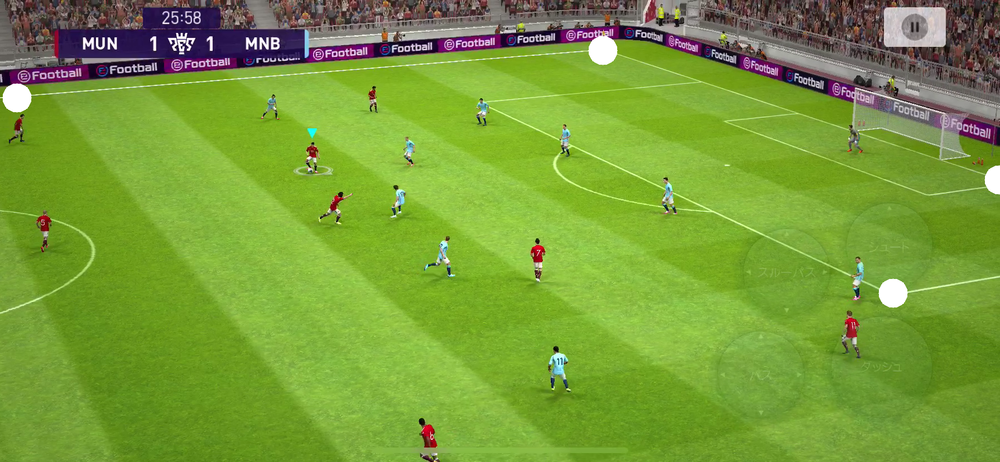

In [359]:
cv2.circle(image, (30, 175), 1, (255, 255, 255), thickness=50)
cv2.circle(image, (1080, 90), 1, (255, 255, 255), thickness=50)
cv2.circle(image, (1790, 322), 1, (255, 255, 255), thickness=50)
cv2.circle(image, (1600, 525), 1, (255, 255, 255), thickness=50)
display_cv_image(image, '.png')

In [356]:
field = cv2.imread('field.png')

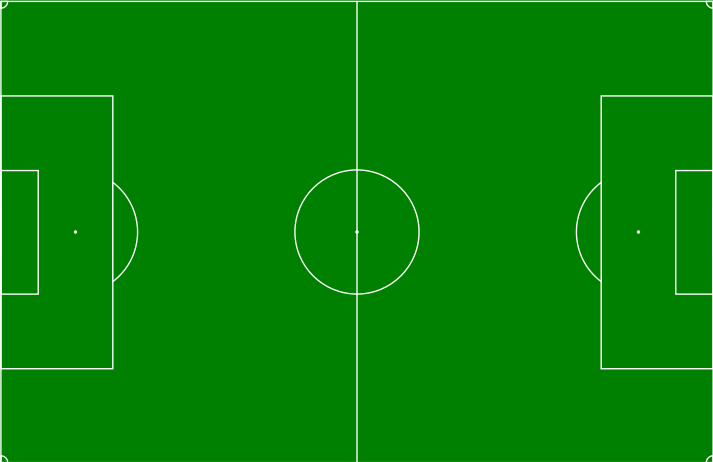

In [289]:
display_cv_image(field, '.png')

In [290]:
field.shape

(462, 713, 3)

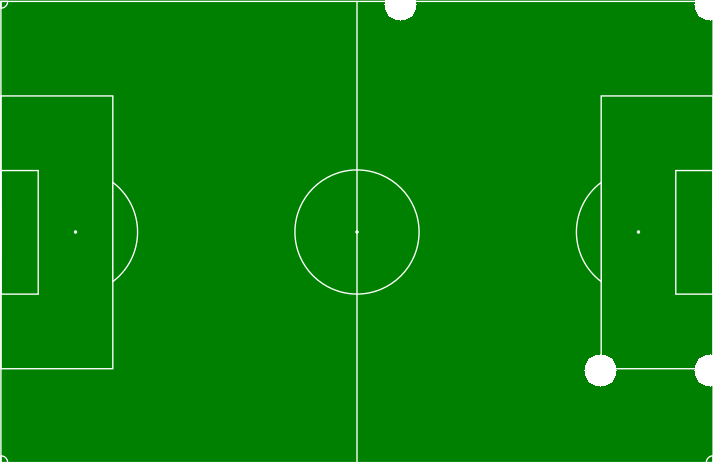

In [358]:
cv2.circle(field, (400, 4), 1, (255, 255, 255), thickness=30)
cv2.circle(field, (710, 4), 1, (255, 255, 255), thickness=30)
cv2.circle(field, (710, 370), 1, (255, 255, 255), thickness=30)
cv2.circle(field, (600, 370), 1, (255, 255, 255), thickness=30)
display_cv_image(field, '.png')